In [1]:
%matplotlib inline

from __future__ import division
import os
import sys
from scipy import integrate, optimize

from scipy.interpolate import interp2d, interp1d

import numpy as np
from numpy import pi,sin,cos,tan,e,arctan,arcsin,arccos,sqrt
from numpy.random import randn
import matplotlib
import matplotlib.pyplot as P
from time import clock

from matplotlib.legend import Legend

matplotlib.rcParams['figure.figsize'] = (9, 6)
P.rcParams['text.usetex'] = True  # not really needed
P.rcParams['text.latex.preamble'] = [r'\usepackage{amsmath}'] #for \text command
P.rcParams["font.size"] = 26
P.rc('xtick', labelsize=23) 
P.rc('ytick', labelsize=23)
# P.rc('xtick', labelsize=20) 
# P.rc('ytick', labelsize=20)
np.set_printoptions(threshold=np.nan)


from magmod import *
from magbias_experiments import SKA_zhangpen, CLAR_zhangpen, SKA1, SKA2, cb_hirax as hirax, hirax512, LSST, LSST_nosgfit, n

from lf_photometric import app2abs, cumulative_lumfun


#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$ 
Rescaling the galaxy number density by a factor of 104185.986576 to match the gold sample with 6330073646.61 total galaxies 
#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$#$ 



# --Check the noise calculations!

## To check the noise here are a few plots that show the different contributions:

In [14]:
plotdir = "/Users/amadeus/Documents/PhD/work/MagBias/plots/"

In [2]:
#get lmin = delta_l for HIRAX and ska:

allskydegree = 4*pi*(180/pi)**2

SKAarea = SKA['S_area']
HIRAXarea = hirax['S_area']
HIRAXfov1 = 15 * (pi/180)**2 #this is from table one of the HIRAX white paper
HIRAXfov2 = 56 * (pi/180)**2
HIRAXfov0 = (HIRAXfov1+HIRAXfov2)/2

print "SKA area = {}".format(SKAarea)
print "HIRAX fov = {} to {}".format(HIRAXfov1, HIRAXfov2)

lminSKA = np.amax([20,np.int(np.around(2*pi/np.sqrt(SKAarea)))]) #never use lmin <20
lminHIRAX = np.amax([20, np.int(np.around(2*pi/np.sqrt(HIRAXfov0)))]) #never use lmin<20
print "min ell SKA: {}, min ell HIRAX: {}".format(lminSKA,lminHIRAX)

SKA area = 5.15
HIRAX fov = 0.0045692612968 to 0.0170585755081
min ell SKA: 20, min ell HIRAX: 60


In [3]:
#first make new zf:

bufferz = 0.1

zf = 1.1
dzf = 0.25
zmin = zf-dzf
zmax = zf+dzf

zbmin = zmax+bufferz
zbmax = 3.9
zb = (zbmin+zbmax)/2
dzb = zb-zbmin



#set the magnitude range:
magmax = 27;
magmin = 19;

#for ell table:
lend = 2200;


print "foreground from {} to {}".format(zf-dzf, zf+dzf)
print "background from {} to {}".format(zb-dzb, zb+dzb)

ltabH = np.logspace(np.log10(lminHIRAX), np.log10(lend + lminHIRAX), 250, dtype = int)
ltabSKA = np.logspace(np.log10(lminSKA), np.log10(lend + lminSKA), 250, dtype = int)

# #TEST:
# ltabH = np.logspace(np.log10(lminHIRAX), np.log10(lend + lminHIRAX), 5, dtype = int)
# ltabSKA = np.logspace(np.log10(lminSKA), np.log10(lend + lminSKA), 5, dtype = int)




foreground from 0.85 to 1.35
background from 1.45 to 3.9


In [4]:
# optimize for HIRAX and SKA in these redshift bins:


ltab_SKA_fornoise_opt = np.array([100]) #only one ell for opt
ltab_H_fornoise_opt = np.array([200]) #only one ell for opt

opti_SKA_fornoise = []
opti_H_fornoise = []
guess_fornoise = 25

S2Nargs_SKA_fornoise = (ltab_SKA_fornoise_opt, zmin, zmax, zbmin, [SKA, LSST], [C_l_HIHI_CAMB, C_l_gg_CAMB, Cl_HIxmag_CAMB], lminSKA)
opti_SKA_fornoise = optimize.minimize( S2N_for_opt, guess_fornoise, args = S2Nargs_SKA_fornoise, method='Nelder-Mead', tol = 1e-2, bounds = ((magmin,magmax),))

S2Nargs_H_fornoise = (ltab_H_fornoise_opt, zmin, zmax, zbmin, [hirax, LSST], [C_l_HIHI_CAMB, C_l_gg_CAMB, Cl_HIxmag_CAMB], lminHIRAX)
opti_H_fornoise = optimize.minimize( S2N_for_opt, guess_fornoise, args = S2Nargs_H_fornoise, method='Nelder-Mead', tol = 1e-2, bounds = ((magmin,magmax),))

    
mso_SKA_fornoise = opti_SKA_fornoise['x'] #m star opt = mso
mso_H_fornoise = opti_H_fornoise['x'] #m star opt = mso


/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/scipy/optimize/_minimize.py:518: RuntimeWarning: Method Nelder-Mead cannot handle constraints nor bounds.
  RuntimeWarning)


Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for

Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for

Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for

Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for exp

Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for exp

Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for exp

Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for exp

Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for exp

Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for exp

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rm

Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rm

Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rm

Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rm

Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rm

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

calculating single dish autocorrelation noise
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Usin

Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment


Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment


Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment


Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment


Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment


Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28

Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28

Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28

Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96

Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96

Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non de

Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non de

Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non de

Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non de

Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non de

Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non de

Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for expe

Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for expe

Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for experiment
Using non default rmax = [23.0859375] for expe

Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non de

Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non de

ell resolution 20
shot noise for LSST!
calculating single dish autocorrelation noise
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experime

Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23

Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23

Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23.10546875] for experiment
Using non default rmax = [23

Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rm

Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rm

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for

Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for

Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for experiment
Using non default rmax = [25.] for

Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for exp

Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for experiment
Using non default rmax = [26.25] for exp

ell resolution 60
shot noise for LSST!
calculating single dish autocorrelation noise
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Usi

Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for exp

Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for experiment
Using non default rmax = [23.75] for exp

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rm

Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rm

Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rmax = [24.375] for experiment
Using non default rm

Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rm

Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rm

Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rmax = [23.125] for experiment
Using non default rm

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non default rmax = [22.5] for experiment
Using non def

Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment


Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment


Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
Using non default rmax = [23.4375] for experiment
ell resolution 60
shot noise for LSST!
calculating single dish autocorrelation noise
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non defau

Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment


Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment
Using non default rmax = [22.8125] for experiment


Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28

Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28

Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28125] for experiment
Using non default rmax = [23.28

Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96

Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96875] for experiment
Using non default rmax = [22.96

ell resolution 60
shot noise for LSST!
calculating single dish autocorrelation noise
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.20

Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non de

Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non de

Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non de

Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non de

Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non default rmax = [23.046875] for experiment
Using non de

Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for expe

Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for expe

Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for experiment
Using non default rmax = [23.1640625] for expe

Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non de

Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non de

Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non default rmax = [23.203125] for experiment
Using non de

Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23

Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23

Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23.14453125] for experiment
Using non default rmax = [23

Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23

Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23

Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23.18359375] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

In [5]:
print mso_H_fornoise

[23.15429688]


In [6]:
#look at different error contributions

p_func_list = [C_l_HIHI_CAMB, C_l_gg_CAMB, Cl_HIxmag_CAMB]


powspeclist_SKA = [p_func_list[0](ltabSKA, zmin, zmax),
               p_func_list[1](ltabSKA, zbmin, mso_SKA_fornoise),
               p_func_list[2](ltabSKA, zf, dzf, zbmin, MAXMAG = mso_SKA_fornoise)]

powspeclist_H = [p_func_list[0](ltabH, zmin, zmax),
               p_func_list[1](ltabH, zbmin, mso_H_fornoise),
               p_func_list[2](ltabH, zf, dzf, zbmin, MAXMAG = mso_H_fornoise)]



#first get the 3 different signals:
#for HIRAX:
Xsignal_H = powspeclist_H[2]
hsignal_H = powspeclist_H[0]
gsignal_H = powspeclist_H[1]

# for SKA
Xsignal_S = powspeclist_SKA[2]
hsignal_S = powspeclist_SKA[0]
gsignal_S = powspeclist_SKA[1]

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23.09570312] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23.15429688] for experiment
Using non default rmax = [23

Using non default rmax = [23.15429688] for experiment


In [7]:
#now for CV
cverr_H = DELTA_Cl_HIxmag(ltabH, zf, dzf, zbmin, powspeclist_H, SURVEY = "CV", MAXMAG = mso_H_fornoise, D_ELL = lminHIRAX)
cverr_S = DELTA_Cl_HIxmag(ltabSKA, zf, dzf, zbmin, powspeclist_SKA, SURVEY = "CV", MAXMAG = mso_SKA_fornoise, D_ELL = lminSKA)
#for HIRAX
HIRAXerr = DELTA_Cl_HIxmag(ltabH, zf, dzf, zbmin, powspeclist_H, SURVEY = [hirax, LSST], MAXMAG = mso_H_fornoise, D_ELL = lminHIRAX)
#for SKA:
SKAerr = DELTA_Cl_HIxmag(ltabSKA, zf, dzf, zbmin, powspeclist_SKA, SURVEY = [SKA, LSST], MAXMAG = mso_SKA_fornoise, D_ELL = lminSKA)

#LSST shot noise:
LSSTshot_H = shotnoise(zbmin, LSST, NINT = 200, MAXMAG = mso_H_fornoise)
LSSTshot_S = shotnoise(zbmin, LSST, NINT = 200, MAXMAG = mso_SKA_fornoise)

#HIRAX N_ell
HIRAXNell = Cl_interferom_noise(ltabH,zmin,zmax, hirax)

#SKA N_ell
SKANell = noise_cls_single_dish(ltabSKA, ztonu21(zf), SKA, 256)

ell resolution 60
ell resolution 20
ell resolution 60
shot noise for LSST!
calculating interferometer noise...
ell resolution 20
shot noise for LSST!
calculating single dish autocorrelation noise
shot noise for LSST!


magmod.py:1078: RuntimeWarning: overflow encountered in exp
  oneover_W_ell = np.exp( ltab**2 * sigb**2) #beam smoothing function.


shot noise for LSST!


In [8]:
print "The error plots have redshifts {} to {} for foregrounds, and {} to {} for backgrounds.".format(zf-dzf, 
                                                                                                      zf+dzf,
                                                                                                     zb-dzb,
                                                                                                     zb+dzb)

The error plots have redshifts 0.85 to 1.35 for foregrounds, and 1.45 to 3.9 for backgrounds.


In [9]:
fsky_hirax = hirax["S_area"] /4/np.pi
fsky_SKA = SKA["S_area"] /4/np.pi


####cosmic variances:

SKACV_factor = np.sqrt(2)/np.sqrt((2*ltabSKA + 1) * fsky_SKA)
HIRAXCV_factor = np.sqrt(2)/np.sqrt((2*ltabH + 1) * fsky_hirax)
#cross:
XCVSKA = np.sqrt(Xsignal_S**2 + hsignal_S * gsignal_S) * SKACV_factor
XCVHIRAX = np.sqrt(Xsignal_H**2 + hsignal_H * gsignal_H) *HIRAXCV_factor
#HI:
HICVSKA = hsignal_S * SKACV_factor
HICVHIRAX = hsignal_H * HIRAXCV_factor
#gal:
GCVSKA = gsignal_S * SKACV_factor
GCVHIRAX = gsignal_H * HIRAXCV_factor

#noise contribution in the cross power spectrum:
XnoiseSKA = np.sqrt(hsignal_S*LSSTshot_S + gsignal_S*SKANell + LSSTshot_S*SKANell)
XnoiseHIRAX = np.sqrt(hsignal_H*LSSTshot_H + gsignal_H*HIRAXNell + LSSTshot_H*HIRAXNell)

#all the x noise terms:
#noise times noise:
ShotNlSKA = LSSTshot_S * SKANell
ShotNlHIRAX = LSSTshot_H * HIRAXNell
#Nl times galaxy signal:
GNlSKA = SKANell * gsignal_S
GNlHIRAX = HIRAXNell * gsignal_H
#shot times HI signal:
HIshotSKA = LSSTshot_S*hsignal_S
HIshotHIRAX = LSSTshot_H*hsignal_H
#HI signal times g signal:
GHISKA = hsignal_S*gsignal_S
GHIHIRAX = hsignal_H*gsignal_H
#mag power spec cv contribution
magCVSKA = Xsignal_S
magCVHIRAX = Xsignal_H


/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/numpy/ma/core.py:6667: RuntimeWarning: overflow encountered in power
  result = np.where(m, fa, umath.power(fa, fb)).view(basetype)


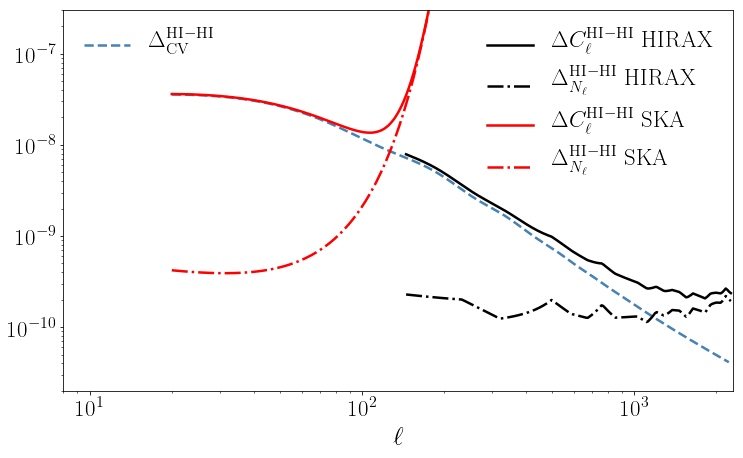

In [10]:
lw = 2.5 #line width


#first all for HI,HI power spectrum:
Hnoisecond = (HIRAXNell < 1e191) 


#for legend:
CVlines = []
CVlabels = []
SKAlines = []
SKAlabels = []
Hlines = []
Hlabels = []

fig = P.figure(figsize = (12,7)); ax = fig.add_subplot(111);

# ax.loglog(ltabSKA, hsignal_S, label = r"$C_\ell^\mathrm{HI-HI}$", c = 'steelblue')
CVlines += ax.loglog(ltabSKA, HICVSKA, color = 'steelblue', ls = "--", lw = lw)
CVlabels.append(r"$\Delta^\mathrm{HI-HI}_\mathrm{CV}$")

Hlines += ax.loglog(ltabH[Hnoisecond], (hsignal_H[Hnoisecond] + HIRAXNell[Hnoisecond]) * HIRAXCV_factor[Hnoisecond], color = "black", lw = lw)
Hlabels.append(r"$\Delta C_\ell^\mathrm{HI-HI} \mathrm{~HIRAX} $")
Hlines += ax.loglog(ltabH[Hnoisecond], HIRAXNell[Hnoisecond] * HIRAXCV_factor[Hnoisecond], color = "black", ls = "-.", lw = lw)
Hlabels.append( r"$\Delta^\mathrm{HI-HI}_{N_\ell}\mathrm{~HIRAX}$" )

SKAlines += ax.loglog(ltabSKA, (hsignal_S + SKANell) * SKACV_factor, color = 'red', lw = lw)
SKAlabels.append(r"$ \Delta C_\ell^\mathrm{HI-HI} \mathrm{~SKA}$")
SKAlines += ax.loglog(ltabSKA, SKANell * SKACV_factor, color = "red", ls = "-.", lw = lw)
SKAlabels.append(r"$\Delta^\mathrm{HI-HI}_{N_\ell} \mathrm{~SKA}$")

ax.set_ylim((2e-11,3e-7))
ax.set_xlim((8e0, 2.3e3))

ax.set_xlabel(r"$\ell$")

#legend stuff:
ax.legend(CVlines, CVlabels, fontsize = 23, loc = "upper left", ncol=1, frameon = False)
leg2 = Legend(ax, np.append(Hlines,SKAlines), np.append(Hlabels,SKAlabels), loc = "upper right", fontsize = 23, frameon = False, ncol = 1)
ax.add_artist(leg2);
# leg3 = Legend(ax, Hlines, Hlabels, loc = "upper right", fontsize = 20, frameon = False, ncol = 1)
# ax.add_artist(leg3);


# P.legend(fontsize = 20, loc = "upper center", ncol=3, frameon = False)
# P.tight_layout()

# P.savefig(plotdir + "HIHI_error_contributions.pdf")

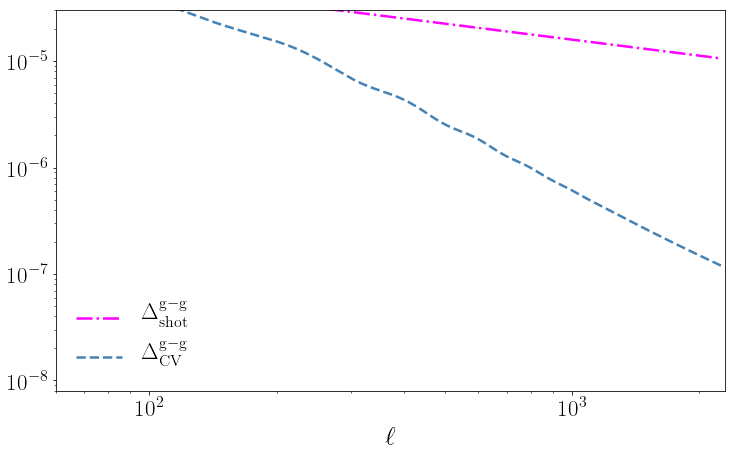

In [11]:
#now for galaxies:

fig = P.figure(figsize = (12,7)); ax = fig.add_subplot(111);
# ax.loglog(ltabH, gsignal_H, label = r"$C_\ell^\mathrm{g-g}$", c= 'steelblue')

# ax.loglog(ltabH, (gsignal_H + LSSTshot_H) * HIRAXCV_factor, label = r"$\Delta C_\ell^\mathrm{g-g}$", color = "magenta")
ax.loglog(ltabH, LSSTshot_H * HIRAXCV_factor, label = r" $\Delta^\mathrm{g-g}_\mathrm{shot}$", color = "magenta", ls = "-.", lw= lw)
ax.loglog(ltabH, GCVHIRAX, label = r"$\Delta^\mathrm{g-g}_\mathrm{CV}$", color = 'steelblue', ls = "--", lw= lw)

# ax.loglog(ltabH, LSSTshot_H * np.ones(len(ltabH)), label = r" $C^{\rm shot}$", color = "magenta", ls = "-.")
# ax.loglog(ltabH, gsignal_H, label = r"$C_\ell^{\rm g-g}$", color = 'magenta', ls = "--")



ax.set_xlim((lminHIRAX,2.3e3))
ax.set_ylim((8e-9, 3e-5))
ax.set_xlabel(r"$\ell$")
P.legend(loc = "lower left", fontsize = 23, frameon = False)
# P.tight_layout()

# P.savefig(plotdir + "GG_error_contributions.pdf")

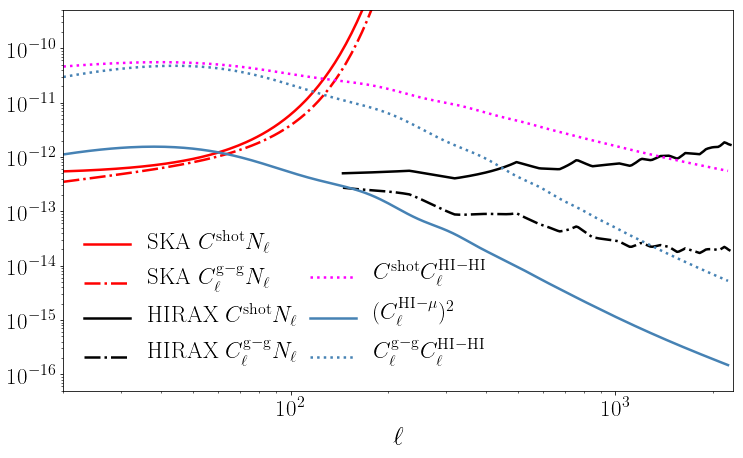

In [15]:
#last but not least the HIxmag power spectrum:

#fixing the HIRAX plotting range:
Hnoisecond1 = (ShotNlHIRAX < 1e90) 
Hnoisecond2 = (GNlHIRAX < 1e90)
Hnoisecond3 = (HIshotHIRAX < 1e90) 
Hnoisecond4 = (GHIHIRAX < 1e90) 
Hnoisecond5 = (magCVHIRAX < 1e90) 

#lines and labels for legend:
SKAlines = []; SKAlabels = [];
Hlines = []; Hlabels = [];
bothlines = []; bothlabels = [];


fig = P.figure(figsize = (12,7)); ax = fig.add_subplot(111);

SKAlines+= ax.loglog(ltabSKA, ShotNlSKA, color = "red", lw = lw)
SKAlabels.append( r"${\rm SKA~}C^{\rm shot}N_\ell$" )
SKAlines+= ax.loglog(ltabSKA, GNlSKA, color = "red", ls = "-.", lw = lw)
SKAlabels.append( r"${\rm SKA~}C_\ell^{\rm g-g}N_\ell$" )

# Hlines+= ax.loglog(ltabH[Hnoisecond1], ShotNlHIRAX[Hnoisecond1], color = "black", ls = "-")
# Hlabels.append( r"${\rm HIRAX~}C^{\rm shot}N_\ell$")
# Hlines+= ax.loglog(ltabH[Hnoisecond2], GNlHIRAX[Hnoisecond2], color = "black", ls = "-.")
# Hlabels.append( r"${\rm HIRAX~}C_\ell^{\rm g-g}N_\ell$" )

SKAlines+= ax.loglog(ltabH[Hnoisecond1], ShotNlHIRAX[Hnoisecond1], color = "black", ls = "-", lw = lw)
SKAlabels.append( r"${\rm HIRAX~}C^{\rm shot}N_\ell$")
SKAlines+= ax.loglog(ltabH[Hnoisecond2], GNlHIRAX[Hnoisecond2], color = "black", ls = "-.", lw = lw)
SKAlabels.append( r"${\rm HIRAX~}C_\ell^{\rm g-g}N_\ell$" )


bothlines+= ax.loglog(ltabSKA, HIshotSKA, color = "magenta", ls = ":", lw = lw)
bothlabels.append( r"$C^{\rm shot} C_\ell^{\rm HI-HI}$" )
bothlines+= ax.loglog(ltabSKA, magCVSKA**2, color = "steelblue", ls = "-", lw = lw)
bothlabels.append( r"$(C_\ell^{{\rm HI-}\mu})^2$" )
bothlines+= ax.loglog(ltabSKA, GHISKA, color = "steelblue", ls = ":", lw = lw)
bothlabels.append( r"$C_\ell^{\rm g-g} C_\ell^{\rm HI-HI}$" )

ax.set_xlabel(r"$\ell$")
ax.set_ylim((5e-17,5e-10))
ax.set_xlim((ltabSKA[0], 2.3e3))

ax.legend(SKAlines, SKAlabels, fontsize = 23, loc = "lower left", frameon = False)
# leg2 = Legend(ax, Hlines, Hlabels, loc = "lower right", fontsize = 23, frameon = False, ncol = 1)
# ax.add_artist(leg2);
leg3 = Legend(ax, bothlines, bothlabels, loc = "lower center", fontsize = 23, frameon = False, ncol = 1)
ax.add_artist(leg3);

# P.savefig(plotdir + "X_error_contributions.pdf")

# More checks:

In [ ]:
# zmin = 0.85; zmax = 1.35;
zmin = 0.5; zmax = 0.55;
# zmin = 0.05; zmax = 0.55;
zf = (zmin + zmax)/2
dzf = zf-zmin


print zmin, zmax, zf- dzf, zf+dzf


In [ ]:
# ltabSKA2 = ltabSKA[::50]
# ltabSKA2 = np.linspace(10,1000,100)
ltabSKA2 = np.linspace(10,1000,30)


S2Nargs_SKA_fornoise = (ltab_SKA_fornoise_opt, zmin, zmax, 
                        zbmin, [SKA, LSST], [C_l_HIHI_CAMB, C_l_gg_CAMB, Cl_HIxmag_CAMB], lminSKA)
opti_SKA_fornoise = optimize.minimize( S2N_for_opt, guess_fornoise, args = S2Nargs_SKA_fornoise, method='Nelder-Mead', tol = 1e-2, bounds = ((magmin,magmax),))
mso_SKA_fornoise = opti_SKA_fornoise['x'] #m star opt = mso


print mso_SKA_fornoise, guess_fornoise

In [ ]:
#plot for alkistis, showing Clgg, ClHIHI, ClHI-my and Nl + Shotnoise
NOUNITS = True

# mso_SKA_fornoise = 26


powspeclist_SKA2 = [p_func_list[0](ltabSKA2, zmin, zmax, NOUNITS = NOUNITS),
               p_func_list[1](ltabSKA2, zbmin, mso_SKA_fornoise),
               p_func_list[2](ltabSKA2, zf, dzf, zbmin, MAXMAG = mso_SKA_fornoise, NOUNITS = NOUNITS)]



#first get the 3 different signals:
#for HIRAX:
# Xsignal_H2 = powspeclist_H2[2]
# hsignal_H2 = powspeclist_H2[0]
# gsignal_H2 = powspeclist_H2[1]

# for SKA
Xsignal_S2 = powspeclist_SKA2[2]
hsignal_S2 = powspeclist_SKA2[0]
gsignal_S2 = powspeclist_SKA2[1]

In [ ]:
#load alkistis' results:
alkroot = "/Users/amadeus/Documents/PhD/work/MagBias/alkistis_test_files/"

# hmunam = "HImu_dz05_sgfix.dat"
hmunam = "HImu_dz05.dat"
hhnam = "HIHI_dz05.dat"
ggnam = "gg_dz05.dat"

alkgg_ell, alkgg = np.loadtxt(alkroot+ggnam, unpack = True)
alkhh_ell, alkhh = np.loadtxt(alkroot+hhnam, unpack = True)
alkhmui_ell, alkhmu = np.loadtxt(alkroot+hmunam, unpack = True)

Using non default rmax = [23.36914062] for experiment
Using non default rmax = [23.36914062] for experiment
Using non default rmax = [23.36914062] for experiment
Using non default rmax = [23.36914062] for experiment
sg ranges from [2.98935046] to 3.09430419997 to [3.20874055]
(5sg-2)ng ranges from [1129342.86299165] to [838635.70838407] to [612715.41608735] (lower - middle - upper)
5sg-2 =  [13.471521]
(5sg-2)ng =  [838635.70838407]
n(z) =  [62479.76268063]


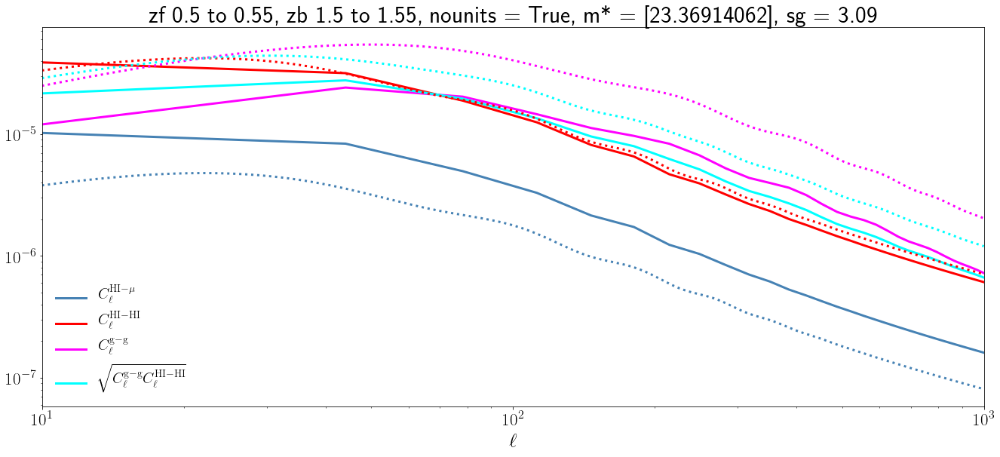

In [37]:
#plot for alkistis, showing Clgg, ClHIHI, ClHI-my and Nl + Shotnoise






fig = P.figure(figsize = (19,9)); ax = fig.add_subplot(111);

ax.loglog(ltabSKA2, Xsignal_S2, label = r"$C_\ell^{\mathrm{HI-}\mu}$", color = 'steelblue', lw = 3)
ax.loglog(ltabSKA2, hsignal_S2, label = r"$C_\ell^{\mathrm{HI-HI}}$", color = 'red', lw = 3)

ax.loglog(ltabSKA2, gsignal_S2, label = r"$C_\ell^{\mathrm{g-g}}$", color = 'magenta', lw = 3)

ax.loglog(ltabSKA2, np.sqrt(gsignal_S2 * hsignal_S2), label = r"$\sqrt{C_\ell^{\mathrm{g-g}}C_\ell^{\mathrm{HI-HI}}}$", color = 'cyan', lw = 3)


#alkistis' lines:
ax.loglog(alkgg_ell, alkgg, color = 'magenta', ls = ":", lw = 3)
ax.loglog(alkhh_ell, alkhh, color = 'red', ls = ":", lw = 3)
ax.loglog(alkhmui_ell, alkhmu, color = 'steelblue', ls = ":", lw = 3)
# ax.loglog(alkhmui_ell, 2*alkhmu, color = 'green', ls = ":", lw = 3, label = "2 x Alkistis' line")
ax.loglog(alkgg_ell, np.sqrt(alkgg*alkhh), color = 'cyan', ls = ":", lw = 3)



# ax.axhline(LSSTshot_S, color = "magenta", ls = "--", label = r"$C_{\rm shot}$")

#sg value for alkistis to reproduce:
sgnow = sg(zb_SKA_fornoise, MAXMAG = mso_SKA_fornoise)[0]
sg5m2 = sg5minus2(zb_SKA_fornoise,mso_SKA_fornoise)
sg5m2ng = sgng_interp(zb_SKA_fornoise, mso_SKA_fornoise)
nofznow = nofz(zb_SKA_fornoise, mso_SKA_fornoise)


print "sg ranges from {} to {} to {}".format(sg(zbmin, MAXMAG = mso_SKA_fornoise), sgnow, sg(zbmax_SKA_fornoise, MAXMAG = mso_SKA_fornoise))
print "(5sg-2)ng ranges from {} to {} to {} (lower - middle - upper)".format(sgng_interp(zbmin, mso_SKA_fornoise), sg5m2ng, sgng_interp(zbmax_SKA_fornoise, mso_SKA_fornoise))
print "5sg-2 =  {}".format(sg5m2)
print "(5sg-2)ng =  {}".format(sg5m2ng)
print "n(z) =  {}".format(nofznow)

ax.set_xlabel(r"$\ell$")
ax.set_xlim((10,1000))
P.legend(fontsize = 20, loc = "lower left", frameon = False)
# ax.set_ylim((1e-9,1e-3))
# ax.set_xlim((8e0, 2.3e3))

# P.tight_layout()
ax.set_title("zf {} to {}, zb {} to {}, nounits = {}, m* = {}, sg = {}".format(zmin, zmax, zbmin, zbmax_SKA_fornoise, NOUNITS, mso_SKA_fornoise, np.around(sgnow,2)))
P.tight_layout()
# P.savefig(plotdir + "many_lines_for_alkistis_zf{}_{}_zb{}_{}.pdf".format(zmin, zmax, zbmin, zbmax_SKA_fornoise))


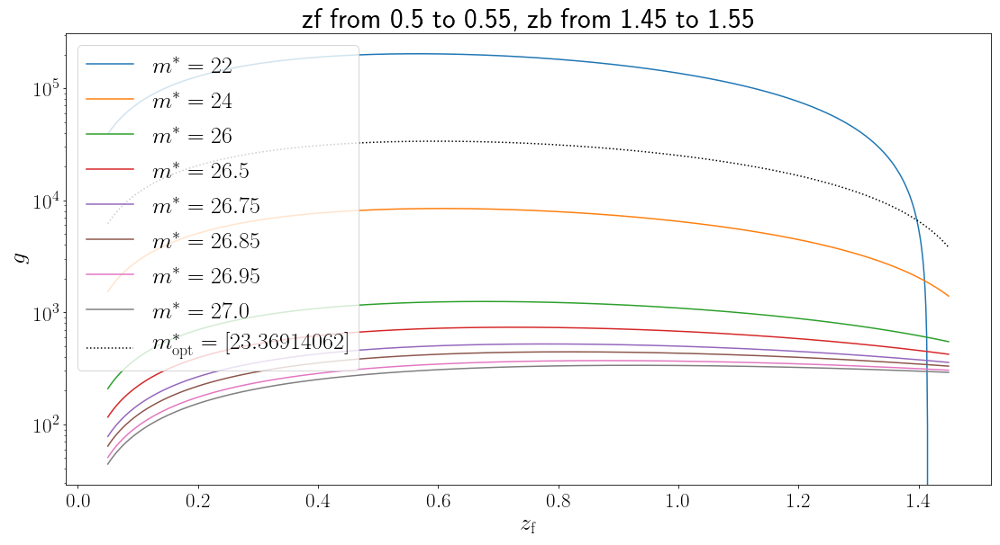

In [40]:
#plot lensing kernel:
zttab = np.linspace(0.05, zbmin,1000)
# zbttab = np.linspace(zb_SKA_fornoise-dzb_SKA_fornoise, zb_SKA_fornoise+dzb_SKA_fornoise)

# mmaxtab = [20,22,24,26,26.5,26.75,26.85,26.95,27.]
mmaxtab = [22,24,26,26.5,26.75,26.85,26.95,27.]
# mmaxtab = [20,25]


fig = P.figure(figsize = (16,9)); ax= fig.add_subplot(111);# ax2=fig.add_subplot(312); ax3=fig.add_subplot(313)


for mm in mmaxtab:

    # gtab = g(zttab, zb_SKA_fornoise, dzb_SKA_fornoise, mso_SKA_fornoise, NINT = 10000)
    gtab = g(zttab, zbmin, mm, NINT = 10000)
    ax.semilogy(zttab, gtab, label = r"$m^*={}$".format(mm))
    
#optimized magmax:
gtab = g(zttab, zbmin, mso_SKA_fornoise, NINT = 10000)
ax.semilogy(zttab, gtab, label = r"$m^*_\mathrm{{opt}}={}$".format(mso_SKA_fornoise), ls = ":", c= "black")

    
ax.set_title("zf from {} to {}, zb from {} to {}".format(zmin, zmax, zbmin, zbmax_SKA_fornoise))
ax.legend()
ax.set_xlabel(r"$z_\mathrm{f}$")
ax.set_ylabel(r"$g$")
P.tight_layout()
# P.savefig(plotdir + "gkernel_for_alkistis_zf{}_{}_zb{}_{}.pdf".format(zmin, zmax, zbmin, zbmax_SKA_fornoise))


In [41]:
mtabfine = np.linspace(19,27,800)
ztabfine = np.linspace(0.01,3.9,500)
mfinemesh, zfinemesh = np.meshgrid(mtabfine, ztabfine)


lclf_fine_mesh = np.zeros(mfinemesh.shape)

for i in range(lclf_fine_mesh.shape[0]):
    for j in range(lclf_fine_mesh.shape[1]):
        absmagred = app2abs(mfinemesh[i,j], zfinemesh[i,j], "red")
        absmagblue = app2abs(mfinemesh[i,j], zfinemesh[i,j], "blue")
        tmp = cumulative_lumfun(absmagred, absmagblue, zfinemesh[i,j], 'all')
        logtmp = np.log10(tmp)
#         logtmp = np.log10(np.abs(tmp))
#         count = 0
#         if np.isnan(logtmp) and count ==0:
#             print tmp
#             count +=1
        lclf_fine_mesh[i,j] = logtmp
        
dlclf_dm = np.gradient(lclf_fine_mesh, mtabfine, axis = 1)

/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/scipy/integrate/quadpack.py:385: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  warnings.warn(msg, IntegrationWarning)
/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log10
  del sys.path[0]
/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/numpy/lib/function_base.py:1011: RuntimeWarning: invalid value encountered in multiply
  out[tuple(slice1)] = a * f[tuple(slice2)] + b * f[tuple(slice3)] + c * f[tuple(slice4)]
/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/numpy/lib/function_base.py:1011: RuntimeWarning: invalid value encountered in add
  out[tuple(slice1)] = a * f[tuple(slice2)] + b * f[tuple(slice3)] + c * f[tuple(slice4)]
/opt/local/Library/Frameworks/Python.framework/Vers

In [42]:
def biastest(z, mstar, TEST = False):
    """magnification bias test via num deriv of cumlumfun"""
    zi = np.argmin( np.abs( ztabfine - z))
    mi = np.argmin( np.abs( mtabfine - mstar))
    res = dlclf_dm[zi, mi]
    if np.isnan(res) and TEST:
        print "nan at zi {} and mi {}".format(zi, mi)
    return res


def cumlumtest(z, mstar, TEST = False):
    """magnification bias test via num deriv of cumlumfun"""
    zi = np.argmin( np.abs( ztabfine - z))
    mi = np.argmin( np.abs( mtabfine - mstar))
    res = lclf_fine_mesh[zi, mi]
    if np.isnan(res) and TEST:
        print "nan at zi {} and mi {}".format(zi, mi)
    return 10**res

In [43]:
mtab = np.linspace(19,27,300)
zzznow = 1.5


# dndznorm_tab = [dndz_norm(zzznow, 3.9, mm) for mm in mtab]
dndz_tab = [nofz(zzznow, mm)[0] for mm in mtab]
# logdndznorm_tab = np.log(np.array(dndznorm_tab))
logdndz_tab = np.log10(np.array(dndz_tab))


cumlum = []
for mm in mtab:
    absmagred = app2abs(mm, zzznow, "red")
    absmagblue = app2abs(mm, zzznow, "blue")
    cumlum.append( cumulative_lumfun(absmagred, absmagblue, zzznow, 'all')[0])
logcumlum = np.log10(np.array(cumlum))

# btest1 = np.gradient(logdndznorm_tab, mtab)
btest12 = np.gradient(logdndz_tab, mtab)
btest2 = np.gradient(logcumlum, mtab)
btest22 = np.array([biastest(zzznow, mm) for mm in mtab])

sgtabtest = [sg(zzznow, MAXMAG = mm) for mm in mtab]

cumlumtabtest = np.array([cumlumtest(zzznow, mm) for mm in mtab])

/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log10
  
/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in log10
  app.launch_new_instance()
/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/numpy/lib/function_base.py:1020: RuntimeWarning: invalid value encountered in double_scalars
  out[tuple(slice1)] = (f[tuple(slice2)] - f[tuple(slice3)]) / dx_0
lf_photometric.py:272: RuntimeWarning: divide by zero encountered in divide
  return 0.4*lumphi/lumPhi


Using non default rmax = 19.0 for experiment
Using non default rmax = 19.0267558528 for experiment
Using non default rmax = 19.0535117057 for experiment
Using non default rmax = 19.0802675585 for experiment
Using non default rmax = 19.1070234114 for experiment
Using non default rmax = 19.1337792642 for experiment
Using non default rmax = 19.1605351171 for experiment
Using non default rmax = 19.1872909699 for experiment
Using non default rmax = 19.2140468227 for experiment
Using non default rmax = 19.2408026756 for experiment
Using non default rmax = 19.2675585284 for experiment
Using non default rmax = 19.2943143813 for experiment
Using non default rmax = 19.3210702341 for experiment
Using non default rmax = 19.347826087 for experiment
Using non default rmax = 19.3745819398 for experiment
Using non default rmax = 19.4013377926 for experiment
Using non default rmax = 19.4280936455 for experiment
Using non default rmax = 19.4548494983 for experiment
Using non default rmax = 19.4816053512

Using non default rmax = 23.6822742475 for experiment
Using non default rmax = 23.7090301003 for experiment
Using non default rmax = 23.7357859532 for experiment
Using non default rmax = 23.762541806 for experiment
Using non default rmax = 23.7892976589 for experiment
Using non default rmax = 23.8160535117 for experiment
Using non default rmax = 23.8428093645 for experiment
Using non default rmax = 23.8695652174 for experiment
Using non default rmax = 23.8963210702 for experiment
Using non default rmax = 23.9230769231 for experiment
Using non default rmax = 23.9498327759 for experiment
Using non default rmax = 23.9765886288 for experiment
Using non default rmax = 24.0033444816 for experiment
Using non default rmax = 24.0301003344 for experiment
Using non default rmax = 24.0568561873 for experiment
Using non default rmax = 24.0836120401 for experiment
Using non default rmax = 24.110367893 for experiment
Using non default rmax = 24.1371237458 for experiment
Using non default rmax = 24.16

(19, 27)

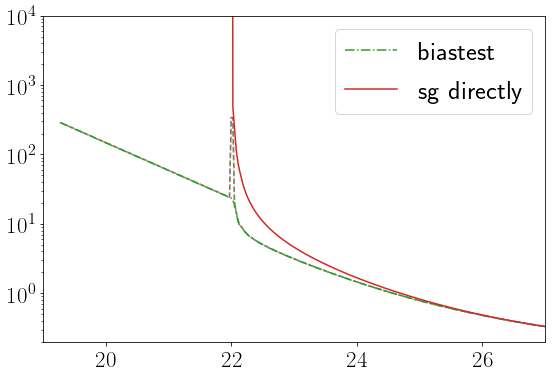

In [44]:
fig = P.figure(); ax= fig.add_subplot(111);
# ax.semilogy(mtab, dndznorm_tab)
# ax.semilogy(mtab, cumlum, ls = ":")

# ax.semilogy(mtab, btest1, label = "dlogN/dm")
ax.semilogy(mtab, btest12, ls = "--")
ax.semilogy(mtab, btest2, ls = ":")
ax.semilogy(mtab, btest22, ls = "-.", label = "biastest")
ax.semilogy(mtab, sgtabtest, label = "sg directly")
# ax.semilogy(mtab, cumlumtabtest, label = "cum lum")

ax.legend()
ax.set_ylim((2e-1,1e4))
# ax.set_ylim((1e-35,1e5))
ax.set_xlim((19,27))

In [45]:
mtab = [20,22,25,27]
zzztab = np.linspace(0.001,3.5, 800)

bias_deriv=[]
sgtab=[]

for mm in mtab:
    bias_deriv.append( np.array([biastest(zzz, mm) for zzz in zzztab]))
    sgtab.append([sg(zzz, MAXMAG = mm) for zzz in zzztab])


Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non d

Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non d

Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non d

lf_photometric.py:272: RuntimeWarning: invalid value encountered in divide
  return 0.4*lumphi/lumPhi



Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non default rmax = 20 for experiment
Using non 

Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non d

Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non d

Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non d

Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non default rmax = 22 for experiment
Using non d

Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non d

Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non d

Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non d

Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non default rmax = 25 for experiment
Using non d

Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non d

Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non d

Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non d

Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non default rmax = 27 for experiment
Using non d

Text(0,0.5,'$s_\\mathrm{g}$')

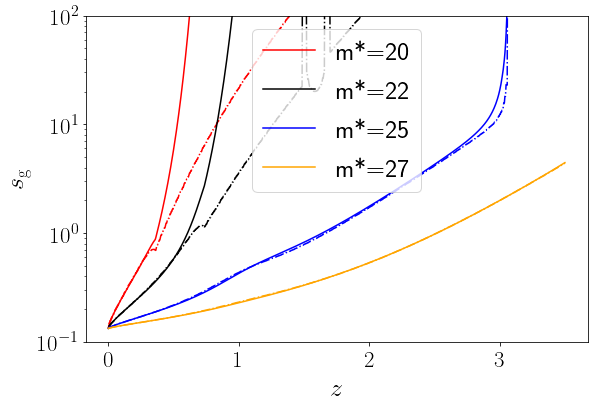

In [46]:
fig = P.figure(); ax= fig.add_subplot(111);

colors = ["red", "black", "blue", "orange", "steel blue"]

for im in range(len(mtab)):


    ax.semilogy(zzztab, bias_deriv[im], ls = "-.", c=colors[im])
    ax.semilogy(zzztab, sgtab[im], label = "m*={}".format(mtab[im]), c = colors[im])

ax.legend()
ax.set_ylim((1e-1,1e2))
ax.set_xlabel("$z$")
ax.set_ylabel(r"$s_\mathrm{g}$")
# P.savefig(plotdir + "test_of_sg.png")

In [47]:
from lf_photometric import lumfun_mag

# excerpt from lf_photometric, just to not have to reload the module


#testing function from amadeus:
def s_magbias_doublereturn(z,rmax,typ) : #just like the original, but different return
    """Magnification bias."""
    z = np.atleast_1d(z)
    z[np.where(z==0.0)]+=0.001

    ilten=1./np.log(10.)
    norm=2.5*ilten
    maglim_red=app2abs(rmax,z,"red")
    maglim_blue=app2abs(rmax,z,"blue")
    lumPhi=cumulative_lumfun(maglim_red,maglim_blue,z,typ)
    if typ=="red" :
        lumphi=norm*lumfun_mag(maglim_red,z,typ)
    elif typ=="blue" :
        lumphi=norm*lumfun_mag(maglim_blue,z,typ)
    elif typ=="all" :
        lumphi_red=norm*lumfun_mag(maglim_blue,z,"red")
        lumphi_blue=norm*lumfun_mag(maglim_blue,z,"blue")
        lumphi=lumphi_blue+lumphi_red

#this is the only line changed:
    return lumphi,lumPhi

In [48]:
mtab = np.linspace(19,27,150)
zzznow = 1.

lphi = []
lPhi = []

for mm in mtab:
    pp,PP=s_magbias_doublereturn(zzznow, mm, "all")
    lphi.append(pp[0])
    lPhi.append(PP[0])
lphi = np.array(lphi)
lPhi = np.array(lPhi)

/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/matplotlib/axes/_base.py:3477: UserWarning: Attempted to set non-positive ylimits for log-scale axis; invalid limits will be ignored.
  'Attempted to set non-positive ylimits for log-scale axis; '


Text(0,0.5,'cumulative lum fun')

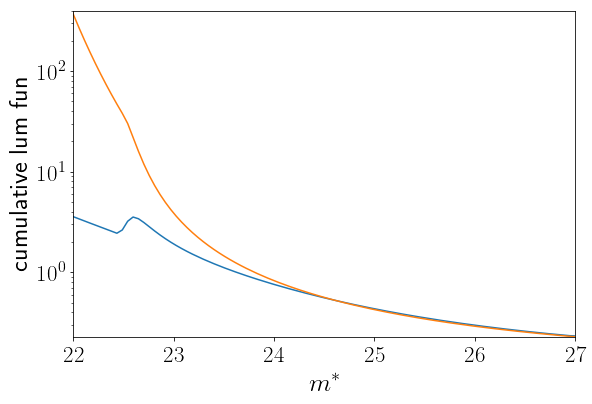

In [49]:
fig = P.figure(); ax= fig.add_subplot(111);
# ax.semilogy(mtab, lphi, ls = "--")
# ax.plot(mtab, lPhi)
# ax.set_ylim((0,0.005))

ax.semilogy(mtab, np.gradient(np.log10(lPhi), mtab))
ax.semilogy(mtab, 0.4*lphi/lPhi)

# ax.plot(mtab, np.log10(lPhi), c= "black")
# ax.plot(mtab, btest22, c='red')
ax.set_ylim((0,400))
# ax.set_ylim((-1,80))
# ax.set_ylim((1e-5,1e-1))
# ax.set_ylim((-0.001,0.04))

ax.set_xlim((22,27))

ax.set_xlabel(r"$m^*$")
ax.set_ylabel("cumulative lum fun")

# P.savefig(plotdir + "cumlumfun_for_alkistis.pdf")


In [50]:
zzztab = np.linspace(0.005,3.5)
mtab = [27,25,23,21]

for mm in mtab:
    btesttab = np.array([biastest(zzz,mm) for zzz in zzztab])